# Python Project: SPX Prediction using Macro-Economic Indicators <br>

### - SPX Data Mining (factor=[SPX, DXY VIX, Mortgage, CPIAUCSL, PPI, PMI, T10Y3M, TVC_US10Y, UNRATE, USINTR, USIRYY, OECD CLI, CCI, RETAILSMSA, INDPRO, S&P_Quarterly_Sales])

#### *By Junseong Lee (Sophomore @ Gies College of Business, University of Illinois at Urbana Champaign; B.S. Finance & Data Science, Computer Science Minor)*

##### Objective:
- This project attempts to find a data series or macro-economic indicators which could be predictive of asset price movements and therefore actionable by investors.

- Assess potential relationships between S&P Index and Macro-economic indicators.

- Build and fit a model to the data of S&P500 and economic indicators.

- Interpretate the model and find a possible association between them.


***

## 0. Introduction to project

Economic indicators provide information about an economy and whether it is expanding or contracting. Most indicators are released monthly by government departments and agencies.

With the pressure of the Russo-Ukraine War and tension between the United States and China, the economy has been on a downward trend for the fiscal year of $2022$. The inflation index CPI has rose about 9.1% over the year 2022, which was the largest jump in $40$ years. The unemployment currently has been staying around $3.5$-$3.7$ percent, and the rate is expected to rise as of Dec. $2022$ as big tech companies began huge layoffs throughout the year; Tesla $29,999$ employees, Microsoft $21,731$ employees, Snap $21,332$ employees, Amazon $10,000$ employees, as well as Carvana, Oracle, Coinbase, Twitter, etc. <br>

For this personal project, I wanted to dive deeper into the relationship between economic numbers, such as **SPX (S&P 500 index)**, **UNRATE (unemployment rate)**, **CPI (the US consumer price index)**, and **TREASURY YIELD (refers to 10-year treasury constant maturity minus 3-month treasury constant maturity)**. Having said that, I will be using what I have learned from the STAT107 class and my previous knowledge in statistical analysis & stock market to examine these numeric values and seek to find potential correlations between the stock market movement and economic indicators. Majorly, I will be looking at the change in significant dates like 9/11, the 2008 subprime mortgage crisis, and the Covid-19 pandemic where the economy drastically fluctuated. 


< quick concepts > <br>
- S&P 500 
    - The Standard & Poor’s 500, often abbreviated as the S&P 500, is an American stock market index based on the market cpitalizations of 500 large companies having common stock listed on the NYSE or NASDAQ
    - Growth of the S&P 500 index can translate into growth of business investment. It can also be a clue to higher future consumer spending. A declining S&P 500 index can signal a tightening of belts for both businesses and consumers.
- CPI
    - A consumer price index (CPI) measures changes in the price level of a market basket of consumer goods and services purchased by households. Changes in CPI are used to assess price changes associated with the cost of living. CPI is one of the most frequently used statistics for identifying period of inflation or deflation. This is because large rises in CPI during a short period of time typically denote periods of inflation and large drops in CPI during a short period of time usually mark periods of deflation
- UNRATE
    - The percentage of unemployed workers in the total labor force
    - Unemployment can result in debt and poverty, and the government has to take care of these people, hence welfare spending would also increase at the same time. In cases where unemployment is very high, there would be a budget deficit, due to a combination of the two, loss of tax revenue and increased welfare spending.
- TREASURY YIELD
    - The 10-year Treasury yield is closely watched as an indicator of broader investor confidence. Because Treasury bills, notes, and bonds carry the full backing of the U.S. government, they are viewed as one of the safest investments.
    - When confidence is high, prices for the 10-year drop and yields rise. This is because investors feel they can find higher-returning investments elsewhere and do not feel they need to play it safe. But when confidence is low, bond prices rise and yields fall, as there is more demand for this safe investment. <br>

*source: investopedia, wikipedia, focus-economics.com*

#### ** Project data unit frequency = MONTHLY <--> index = 1998-2022 **

***
## 1.1 Raw Data Retrieval

> import libraries

In [3]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt    # if I'm using jupiter notebook, then adding %matplotlib inline is necessary
%matplotlib inline
import seaborn as sns
import missingno as msno
import warnings
warnings.filterwarnings('ignore')
from datetime import datetime
import sys
from PIL import Image
import os
import random
import statsmodels.api as sm

# ML library import
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

> Read read the data CSV files into the notebook to make sure the data loads correctly.

In [200]:
# create directory path
project_directory = "/Users/jun/Desktop/PythonProject/"
my_path = "/Users/jun/Desktop/PythonProject/Indicators"

In [201]:
# ALL DATA RETRIEVED FROM TRADINGVIEW (1998-2022)
df_SPX = pd.read_csv(my_path + '/SPX_1m.csv')
df_DXY = pd.read_csv(my_path + '/DXY_1m.csv')
df_VIX = pd.read_csv(my_path + '/VIX_1m.csv')
df_mortgage = pd.read_csv(my_path + '/MORTGAGE30US_1m.csv')
df_CPIAUCSL = pd.read_csv(my_path + '/CPIAUCSL_1m.csv')
# df_USCCPI = pd.read_csv(my_path + '/USCCPI_1m.csv')
# df_USCPI = pd.read_csv(my_path + '/USCPI_1m.csv')
df_PPI = pd.read_csv(my_path + '/PPIACO_1m.csv')
df_PMI = pd.read_csv(my_path + '/USCPMI_1m.csv')
df_T10Y3M = pd.read_csv(my_path + '/T10Y3M_1m.csv')
# df_T10Y2Y = pd.read_csv(my_path + '/T10Y2Y_1m.csv')
# df_TVC_US02Y = pd.read_csv(my_path + '/TVC_US02Y_1m.csv')
df_TVC_US10Y = pd.read_csv(my_path + '/TVC_US10Y_1m.csv')
df_UNRATE = pd.read_csv(my_path + '/UNRATE_1m.csv')
df_USINTR = pd.read_csv(my_path + '/USINTR_1m.csv')
# df_USIRMM = pd.read_csv(my_path + '/USIRMM_1m.csv')
df_USIRYY = pd.read_csv(my_path + '/USIRYY_1m.csv')
df_CLI = pd.read_csv(my_path + '/OECDCLI_1m.csv')
df_CCI = pd.read_csv(my_path + '/USCCI_1m.csv')
df_INDPRO = pd.read_csv(my_path + '/INDPRO_1m.csv')
df_RETAIL = pd.read_csv(my_path + '/RETAILSMSA_1m.csv')
df_SPQSALES = pd.read_csv(my_path + '/SPQSALES.csv')



## 1.2 Data Cleaning

> convert unreadable date values to a common datetime format

In [203]:
# option 1 - to datetime
df_SPX['time'] = pd.to_datetime(df_SPX['time'], infer_datetime_format=True) # S&P Index monthly data
df_DXY['time'] = pd.to_datetime(df_DXY['time'], infer_datetime_format=True) # Dollar Currency data
df_VIX['time'] = pd.to_datetime(df_VIX['time'], infer_datetime_format=True) # Volatility Index data
df_mortgage['time'] = pd.to_datetime(df_mortgage['time'], infer_datetime_format=True) # 30 year Mortgage Rate data
df_CPIAUCSL['time'] = pd.to_datetime(df_CPIAUCSL['time'], infer_datetime_format=True) # US All Urban Consumer Price Index data
df_PPI['time'] = pd.to_datetime(df_PPI['time'], infer_datetime_format=True)
df_PMI['time'] = pd.to_datetime(df_PMI['time'], infer_datetime_format=True) 
df_T10Y3M['time'] = pd.to_datetime(df_T10Y3M['time'], infer_datetime_format=True)
df_TVC_US10Y['time'] = pd.to_datetime(df_TVC_US10Y['time'], infer_datetime_format=True) 
df_UNRATE['time'] = pd.to_datetime(df_UNRATE['time'], infer_datetime_format=True) # US Unemployment Rate data
df_USINTR['time'] = pd.to_datetime(df_USINTR['time'], infer_datetime_format=True) # US Interest Rate data
df_USIRYY['time'] = pd.to_datetime(df_USIRYY['time'], infer_datetime_format=True) # US Interest Rate YoY data
df_CLI['time'] = pd.to_datetime(df_CLI['time'], infer_datetime_format=True) # OECD Composite Leading Index data
df_CCI['time'] = pd.to_datetime(df_CCI['time'], infer_datetime_format=True) # US Consumer Confidence Index data
df_INDPRO['time'] = pd.to_datetime(df_INDPRO['time'], infer_datetime_format=True) # US industry production monthly data
df_RETAIL['time'] = pd.to_datetime(df_RETAIL['time'], infer_datetime_format=True) # monthly US retail data
df_SPQSALES['time'] = pd.to_datetime(df_SPQSALES['time'], infer_datetime_format=True) # quarterly s&p sales data

In [205]:
# option 2 - to integer
def to_integer(dt_time):
    return 10000*dt_time.year + 100*dt_time.month + dt_time.day

time = []
for i in df_SPX['time']:
    t = to_integer(i) # datetime.strptime(i, '%m/%d/%y')
    d = {'DATE': t}
    time.append(d)
df = pd.DataFrame(time)
df

,DATE
0,19980101
1,19980202
2,19980302
3,19980401
4,19980501
...,...
295,20220801
296,20220901
297,20221003
298,20221101


But we will go with option 1.

> Go through each dataframe and ensure the data is clean to look at. Then, add percent change columns

In [206]:
# create function to apply to each dataframe
def add_percentChange(df, string): 
    df[string] = df['close'].pct_change()
    df.dropna(inplace = True)
    return df

In [207]:
# add SPX % change manually 
df_SPX['SPX % Change'] = df_SPX['avg'].pct_change()     # df_SPX.dropna(inplace = True)
# now add percent change for other data using function
# add_percentChange(df_SPX,"SPX % Change")
add_percentChange(df_DXY,"DXY % Change")
add_percentChange(df_VIX,"VIX % Change")
add_percentChange(df_mortgage,"Mortgage % Change")
add_percentChange(df_CPIAUCSL,"CPIAUCSL % Change")
add_percentChange(df_PPI,"PPI % Change")
add_percentChange(df_PMI,"PMI % Change")
add_percentChange(df_T10Y3M,"T10Y3M % Change")
add_percentChange(df_TVC_US10Y, 'TVC_US10Y % Change')
add_percentChange(df_CLI,"OECD CLI % Change")
add_percentChange(df_UNRATE,"UNRATE % Change")
add_percentChange(df_USINTR,"USINTR % Change")
add_percentChange(df_USIRYY,"USIRYY % Change")
add_percentChange(df_INDPRO,"INDPRO % Change")
add_percentChange(df_RETAIL,"RETAIL % Change")
add_percentChange(df_CCI,"CCI % Change")            
add_percentChange(df_SPQSALES, 'S&P Sales % Change')

,time,close,S&P Sales % Change
1,2001-03-31,751.27,0.007469
2,2001-06-30,748.23,-0.004046
3,2001-09-30,738.81,-0.012590
4,2001-12-31,736.88,-0.002612
5,2002-03-31,718.01,-0.025608
...,...,...,...
82,2021-06-30,1462.75,0.049431
83,2021-09-30,1511.10,0.033054
84,2021-12-31,1566.80,0.036861
85,2022-03-31,1616.48,0.031708


> Change closing price column ('close') to each indicator name

In [208]:
df_SPX.rename(columns={'close':'SPX'}, inplace=True)
df_DXY.rename(columns={'close':'DXY'}, inplace=True)
df_VIX.rename(columns={'close':'VIX'}, inplace=True)
df_mortgage.rename(columns={'close':'Mortgage'}, inplace=True)
df_CPIAUCSL.rename(columns={'close':'CPIAUCSL'}, inplace=True)
df_PPI.rename(columns={'close':'PPI'}, inplace=True)
df_PMI.rename(columns={'close':'PMI'}, inplace=True)
df_T10Y3M.rename(columns={'close':'T10Y3M'}, inplace=True)
df_TVC_US10Y.rename(columns={'close':'TVC_US10Y'}, inplace=True)
df_CLI.rename(columns={'close':'OECD CLI'}, inplace=True)
df_UNRATE.rename(columns={'close':'UNRATE'}, inplace=True)
df_USINTR.rename(columns={'close':'USINTR'}, inplace=True)
df_USIRYY.rename(columns={'close':'USIRYY'}, inplace=True)
df_INDPRO.rename(columns={'close':'INDPRO'}, inplace=True)
df_RETAIL.rename(columns={'close':'RETAIL'}, inplace=True)
df_CCI.rename(columns={'close':'CCI'}, inplace=True)
df_SPQSALES.rename(columns={'close':'S&P Sales'}, inplace=True)


> Pull all the key dataframes into one Master Dataframe, then export the data to a CSV file for closer inspection using Excel.

In [209]:
df_master = df_SPX[['time','SPX', 'avg', 'SPX % Change']].copy()

df_master = pd.merge(df_master, df_DXY[['time','DXY','DXY % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_VIX[['time','VIX','VIX % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_mortgage[['time','Mortgage','Mortgage % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_CPIAUCSL[['time','CPIAUCSL','CPIAUCSL % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_PPI[['time','PPI','PPI % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_PMI[['time','PMI','PMI % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_T10Y3M[['time','T10Y3M','T10Y3M % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_TVC_US10Y[['time','TVC_US10Y','TVC_US10Y % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_CLI[['time','OECD CLI','OECD CLI % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_UNRATE[['time','UNRATE','UNRATE % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_USINTR[['time','USINTR','USINTR % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_USIRYY[['time','USIRYY','USIRYY % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_INDPRO[['time','INDPRO','INDPRO % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_RETAIL[['time','RETAIL','RETAIL % Change']], how='outer', on=['time'])
df_master = pd.merge(df_master, df_CCI[['time','CCI','CCI % Change']], how='outer', on=['time'])
# df_master = pd.merge(df_master, df_SPQSALES[['time','S&P Sales','S&P Sales % Change']], how='outer', on=['time'])

df_master = df_master.sort_values(by='time', ascending=True)
df_master.to_csv(path_or_buf = "/Users/jun/Desktop/PythonProject/mastertable.csv", index=False)
df_master

,time,SPX,avg,SPX % Change,DXY,DXY % Change,VIX,VIX % Change,Mortgage,Mortgage % Change,...,USINTR,USINTR % Change,USIRYY,USIRYY % Change,INDPRO,INDPRO % Change,RETAIL,RETAIL % Change,CCI,CCI % Change
1304,1997-10-31 18:00:00-06:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.089360e+11,0.004123,NaN,NaN
1302,1997-11-30 18:00:00-06:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,83.9696,0.004518,2.093630e+11,0.002044,NaN,NaN
1303,1997-12-31 18:00:00-06:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,84.3467,0.004491,2.096660e+11,0.001447,NaN,NaN
0,1998-01-01 08:30:00-06:00,980.28,975.355,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
898,1998-01-31 18:00:00-06:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.09,-0.004213,...,5.5,0.0,1.4,-0.125,84.4865,0.001657,2.095520e+11,-0.000544,110.4,0.035647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,2022-11-01 08:30:00-05:00,4080.11,3990.950,0.066849,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1301,2022-11-30 16:00:00-06:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
598,2022-11-30 18:00:00-06:00,NaN,NaN,NaN,105.062,-0.00766,NaN,NaN,6.33,-0.037994,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.1,0.040493
897,2022-12-01 02:10:00-06:00,NaN,NaN,NaN,NaN,NaN,24.52,0.192027,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


the mastertable has contents, but the data isn't merged correctly with timeframe, so I will use .merge instead of pd.concat()

In [210]:
df_MASTER = pd.concat([df_SPX[['time','SPX','SPX % Change']],df_DXY[['DXY','DXY % Change']],df_VIX[['VIX','VIX % Change']],df_mortgage[['Mortgage','Mortgage % Change']],df_CPIAUCSL[['CPIAUCSL','CPIAUCSL % Change']],df_PPI[['PPI','PPI % Change']],df_PMI[['PMI','PMI % Change']],df_T10Y3M[['T10Y3M','T10Y3M % Change']],df_TVC_US10Y[['TVC_US10Y','TVC_US10Y % Change']],df_CLI[['OECD CLI','OECD CLI % Change']],df_UNRATE[['UNRATE','UNRATE % Change']],df_USINTR[['USINTR','USINTR % Change']],df_USIRYY[['USIRYY','USIRYY % Change']],df_INDPRO[['INDPRO','INDPRO % Change']],df_RETAIL[['RETAIL','RETAIL % Change']], df_CCI[['CCI','CCI % Change']],df_SPQSALES[['S&P Sales','S&P Sales % Change']]],axis = 1)
df_MASTER = df_MASTER.sort_values(by='time', ascending=True)
df_MASTER.to_csv(path_or_buf = "/Users/jun/Desktop/PythonProject/mastertable.csv", index=False)
df_MASTER

,time,SPX,SPX % Change,DXY,DXY % Change,VIX,VIX % Change,Mortgage,Mortgage % Change,CPIAUCSL,...,USIRYY,USIRYY % Change,INDPRO,INDPRO % Change,RETAIL,RETAIL % Change,CCI,CCI % Change,S&P Sales,S&P Sales % Change
0,1998-01-01 08:30:00-06:00,980.28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1998-02-02 08:30:00-06:00,1049.34,0.040452,99.820,-0.009624,18.55,-0.136004,7.09,-0.004213,162.0,...,1.4,-0.125000,83.9696,0.004518,2.089360e+11,0.004123,110.4,0.035647,751.27,0.007469
2,1998-03-02 08:30:00-06:00,1101.75,0.060016,101.500,0.016830,24.22,0.305660,7.08,-0.001410,162.2,...,1.4,0.000000,84.3467,0.004491,2.093630e+11,0.002044,106.5,-0.035326,748.23,-0.004046
3,1998-04-01 08:30:00-06:00,1111.77,0.028860,99.710,-0.017635,21.18,-0.125516,7.15,0.009887,162.6,...,1.4,0.000000,84.4865,0.001657,2.096660e+11,0.001447,108.7,0.020657,738.81,-0.012590
4,1998-05-01 08:30:00-05:00,1090.82,-0.004947,100.450,0.007422,21.32,0.006610,7.07,-0.011189,162.8,...,1.7,0.214286,84.5212,0.000411,2.095520e+11,-0.000544,106.5,-0.020239,736.88,-0.002612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,2022-08-01 08:30:00-05:00,3954.99,0.019729,108.685,0.026997,25.86,0.212946,5.55,0.047170,296.8,...,8.3,-0.023529,104.0772,-0.000839,5.917930e+11,0.002635,58.2,0.130097,NaN,NaN
296,2022-09-01 08:30:00-05:00,3585.61,-0.067560,112.173,0.032093,31.61,0.222351,6.70,0.207207,298.1,...,8.2,-0.012048,104.7577,0.006538,5.981450e+11,0.010733,58.6,0.006873,NaN,NaN
297,2022-10-03 08:30:00-05:00,3871.97,-0.005396,111.578,-0.005304,25.89,-0.180955,7.08,0.056716,NaN,...,7.7,-0.060976,104.6544,-0.000986,5.958940e+11,-0.003763,59.9,0.022184,NaN,NaN
298,2022-11-01 08:30:00-05:00,4080.11,0.066849,105.873,-0.051130,20.57,-0.205485,6.58,-0.070621,NaN,...,NaN,NaN,104.8050,0.001439,5.983800e+11,0.004172,56.8,-0.051753,NaN,NaN


Now. Modify the S&P Quarterly Sales data on df_MASTERTABLE so that it is fitted correctly; save to a new .csv file. Then, Slice the master dataframe down to start in 2000. Thats when S&P quarterly sales data begins. Import the file

In [212]:
df_master_2000 = pd.read_csv(project_directory+'mastertable_2000.csv')
df_master_2000.head(5)

,time,SPX,SPX % Change,DXY,DXY % Change,VIX,VIX % Change,Mortgage,Mortgage % Change,CPIAUCSL,...,USIRYY,USIRYY % Change,INDPRO,INDPRO % Change,RETAIL,RETAIL % Change,CCI,CCI % Change,S&P Sales,S&P Sales % Change
0,2001-01-02 08:30:00-06:00,1366.01,0.018367,110.47,0.010520,22.02,-0.179888,7.15,0.002805,176.0,...,3.7,0.088235,92.8395,0.000037,2.510000e+11,-0.002446,94.7,-0.037602,745.70,NaN
1,2001-02-01 08:30:00-06:00,1239.94,-0.030034,111.93,0.013216,28.35,0.287466,7.12,-0.004196,176.1,...,3.5,-0.054054,92.5334,-0.003297,2.500000e+11,-0.003543,90.6,-0.043295,NaN,NaN
2,2001-03-01 08:30:00-06:00,1160.34,-0.079782,117.48,0.049585,28.64,0.010229,6.91,-0.029494,176.4,...,2.9,-0.171429,92.0304,-0.005436,2.510000e+11,0.001306,91.5,0.009934,NaN,NaN
3,2001-04-02 08:30:00-05:00,1249.48,0.004984,115.88,-0.013619,25.48,-0.110335,7.12,0.030391,177.3,...,3.3,0.137931,91.4079,-0.006764,2.530000e+11,0.007963,88.4,-0.033880,751.27,0.007469
4,2001-05-01 08:30:00-05:00,1255.84,0.039719,119.09,0.027701,22.64,-0.111460,7.20,0.011236,177.7,...,3.6,0.090909,91.1751,-0.002547,2.530000e+11,0.000198,92.0,0.040724,NaN,NaN


> Null Check

column:       time	 Percent of NaN value: 0.00%
column:        SPX	 Percent of NaN value: 0.00%
column: SPX % Change	 Percent of NaN value: 0.00%
column:        DXY	 Percent of NaN value: 0.00%
column: DXY % Change	 Percent of NaN value: 0.00%
column:        VIX	 Percent of NaN value: 0.00%
column: VIX % Change	 Percent of NaN value: 0.00%
column:   Mortgage	 Percent of NaN value: 0.00%
column: Mortgage % Change	 Percent of NaN value: 0.00%
column:   CPIAUCSL	 Percent of NaN value: 1.14%
column: CPIAUCSL % Change	 Percent of NaN value: 1.14%
column:        PPI	 Percent of NaN value: 0.38%
column: PPI % Change	 Percent of NaN value: 0.38%
column:        PMI	 Percent of NaN value: 0.38%
column: PMI % Change	 Percent of NaN value: 0.38%
column:     T10Y3M	 Percent of NaN value: 0.00%
column: T10Y3M % Change	 Percent of NaN value: 0.00%
column:  TVC_US10Y	 Percent of NaN value: 0.00%
column: TVC_US10Y % Change	 Percent of NaN value: 0.00%
column:   OECD CLI	 Percent of NaN value: 0.76%
col

<AxesSubplot:>

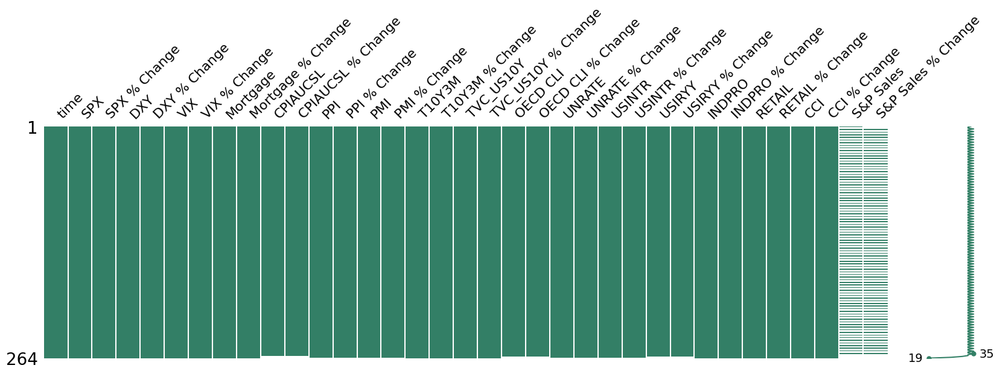

In [213]:
for col in df_master_2000.columns:
    msg = 'column: {:>10}\t Percent of NaN value: {:.2f}%'.format(col, 100 * (df_master_2000[col].isnull().sum() / df_master_2000[col].shape[0]))
    print(msg)
msno.matrix(df=df_master_2000.iloc[:, :], figsize=(20,5), color=(0.2, 0.5, 0.4))
plt.title('Null Data Visualization')
plt.show()

***
## 2. Exploratory Analysis (Data Visualization and Data Mining)

In [214]:
# Checking Columns
print(df_master_2000.columns.values)

['time' 'SPX' 'SPX % Change' 'DXY' 'DXY % Change' 'VIX' 'VIX % Change'
 'Mortgage' 'Mortgage % Change' 'CPIAUCSL' 'CPIAUCSL % Change' 'PPI'
 'PPI % Change' 'PMI' 'PMI % Change' 'T10Y3M' 'T10Y3M % Change'
 'TVC_US10Y' 'TVC_US10Y % Change' 'OECD CLI' 'OECD CLI % Change' 'UNRATE'
 'UNRATE % Change' 'USINTR' 'USINTR % Change' 'USIRYY' 'USIRYY % Change'
 'INDPRO' 'INDPRO % Change' 'RETAIL' 'RETAIL % Change' 'CCI'
 'CCI % Change' 'S&P Sales' 'S&P Sales % Change']


> Create a list of significant dates (911, Subprime Mortgage Crisis, Covid-19 Pandemic)

In [215]:
# The (likely) coronavirus recession. ...
# The Great Recession (December 2007 to June 2009) ...
# Dot-com recession (March 2001 to November 2001) ...
# Gulf War recession (July 1990 to March 1991) ...
# Energy crisis recession (July 1981 to November 1982)
# but I will only include the 3 major events that influenced the stock market starting after 2000. 
xposition = [pd.to_datetime('2007-08-01'), pd.to_datetime('2009-04-01'), pd.to_datetime('2018-01-01'), pd.to_datetime('2020-03-01')]

> Use concatenation to build a variable - data without time series data for correlation analysis

In [216]:
data = df_master_2000[['SPX','SPX % Change', 'DXY', 'DXY % Change', 'VIX', 'VIX % Change',
 'Mortgage', 'Mortgage % Change', 'CPIAUCSL', 'CPIAUCSL % Change', 'PPI',
 'PPI % Change', 'PMI', 'PMI % Change', 'T10Y3M', 'T10Y3M % Change',
 'TVC_US10Y', 'TVC_US10Y % Change', 'OECD CLI', 'OECD CLI % Change', 'UNRATE',
 'UNRATE % Change', 'USINTR', 'USINTR % Change', 'USIRYY', 'USIRYY % Change',
 'INDPRO', 'INDPRO % Change', 'RETAIL', 'RETAIL % Change', 'CCI',
 'CCI % Change', 'S&P Sales', 'S&P Sales % Change']]
data.head(10)

,SPX,SPX % Change,DXY,DXY % Change,VIX,VIX % Change,Mortgage,Mortgage % Change,CPIAUCSL,CPIAUCSL % Change,...,USIRYY,USIRYY % Change,INDPRO,INDPRO % Change,RETAIL,RETAIL % Change,CCI,CCI % Change,S&P Sales,S&P Sales % Change
0,1366.01,0.018367,110.47,0.010520,22.02,-0.179888,7.15,0.002805,176.0,0.002278,...,3.7,0.088235,92.8395,0.000037,2.510000e+11,-0.002446,94.7,-0.037602,745.70,NaN
1,1239.94,-0.030034,111.93,0.013216,28.35,0.287466,7.12,-0.004196,176.1,0.000568,...,3.5,-0.054054,92.5334,-0.003297,2.500000e+11,-0.003543,90.6,-0.043295,NaN,NaN
2,1160.34,-0.079782,117.48,0.049585,28.64,0.010229,6.91,-0.029494,176.4,0.001704,...,2.9,-0.171429,92.0304,-0.005436,2.510000e+11,0.001306,91.5,0.009934,NaN,NaN
3,1249.48,0.004984,115.88,-0.013619,25.48,-0.110335,7.12,0.030391,177.3,0.005102,...,3.3,0.137931,91.4079,-0.006764,2.530000e+11,0.007963,88.4,-0.033880,751.27,0.007469
4,1255.84,0.039719,119.09,0.027701,22.64,-0.111460,7.20,0.011236,177.7,0.002256,...,3.6,0.090909,91.1751,-0.002547,2.530000e+11,0.000198,92.0,0.040724,NaN,NaN
5,1226.99,-0.008342,119.45,0.003023,19.06,-0.158127,7.11,-0.012500,177.4,-0.001688,...,3.2,-0.111111,90.8767,-0.003273,2.500000e+11,-0.009402,92.6,0.006522,NaN,NaN
6,1211.22,-0.019429,117.11,-0.019590,21.62,0.134313,7.03,-0.011252,177.4,0.000000,...,2.7,-0.156250,90.3750,-0.005521,2.550000e+11,0.017717,92.4,-0.002160,748.23,-0.004046
7,1133.58,-0.036261,113.26,-0.032875,24.92,0.152636,6.92,-0.015647,178.1,0.003946,...,2.7,0.000000,89.8626,-0.005670,2.550000e+11,0.001786,91.5,-0.009740,NaN,NaN
8,1040.90,-0.073939,113.53,0.002384,31.93,0.281300,6.72,-0.028902,177.6,-0.002807,...,2.6,-0.037037,89.3288,-0.005940,2.540000e+11,-0.004686,81.8,-0.106011,NaN,NaN
9,1059.78,-0.034172,114.83,0.011451,33.56,0.051049,6.64,-0.011905,177.5,-0.000563,...,2.1,-0.192308,89.2201,-0.001217,2.530000e+11,-0.004035,82.7,0.011002,738.81,-0.012590


> Correlation Maxtix Heatmap
- I have created a Pearson Correlation heatmap to identify the potential relationship between each indicator. The map is shown below:

- correlation matrix (heatmap) indicates there is somewhat a correlation between 10yr treasury yield and unemployment rate --> Graph a dual axis plot for data series.

In [217]:
from  matplotlib.colors import LinearSegmentedColormap
def createHeatmap(dataframe, size):
    # create size
    plt.figure(figsize = (size,size))
    
    # create custom colormap
    c = ["darkred","red","lightcoral","white", "palegreen","green","darkgreen"]
    v = [0,.15,.4,.5,0.6,.9,1.]
    l = list(zip(v,c))
    colormap=LinearSegmentedColormap.from_list('rg',l, N=256)
    sns.heatmap(dataframe.astype(float).corr(), cmap=colormap, annot=True)
    plt.show()

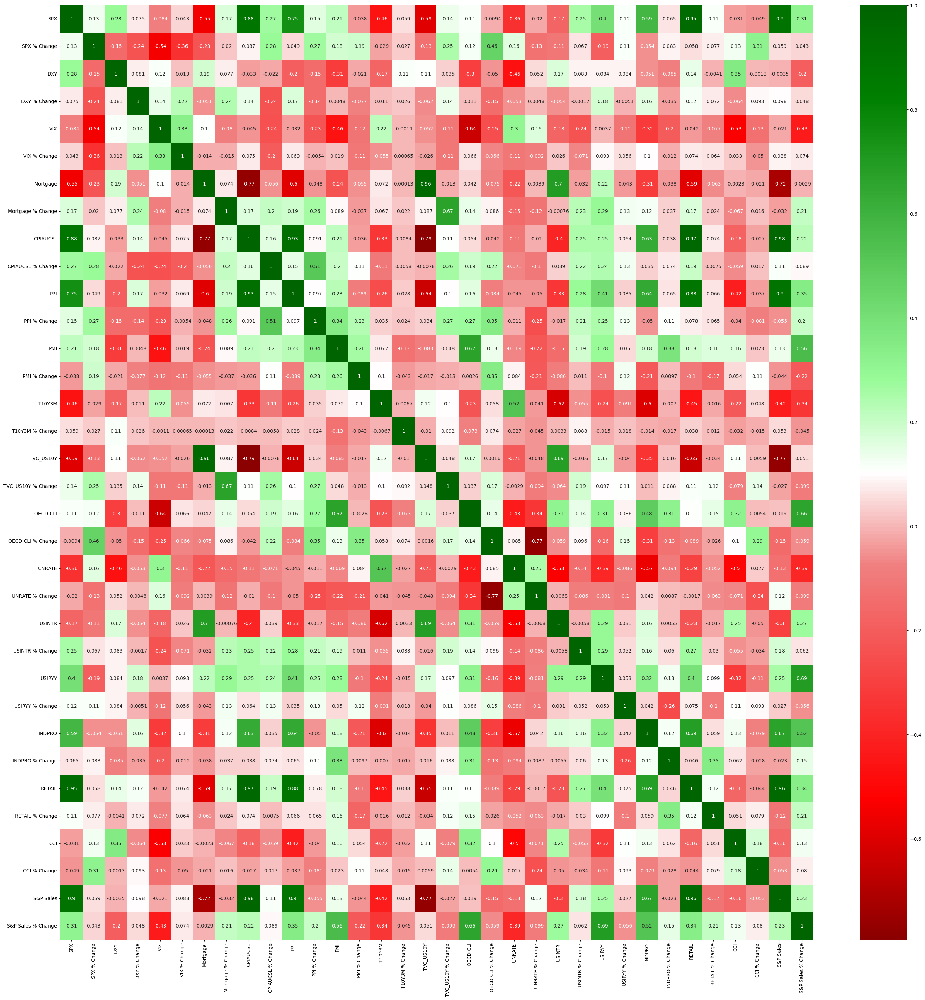

In [218]:
createHeatmap(data,35)

>Logarithmic Analysis

In [219]:
def logDataFrame(dataframe):
    df = dataframe
    df = np.log(df)
    return df

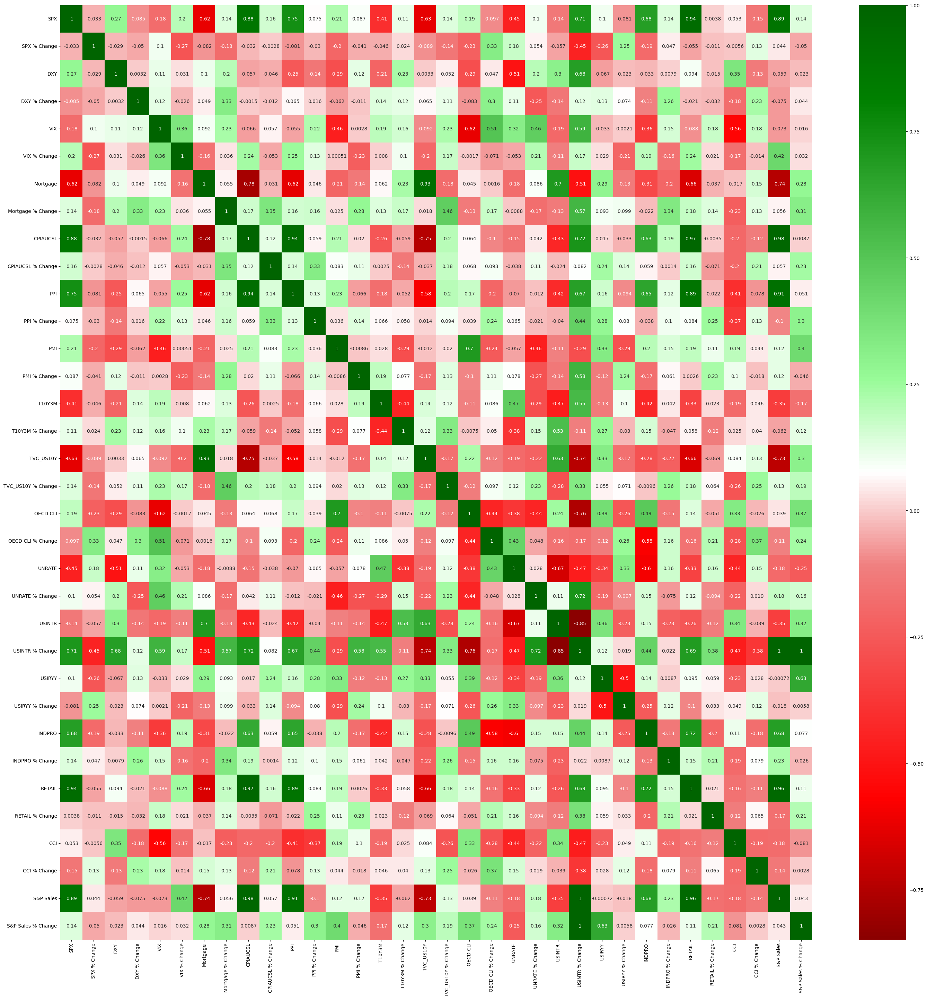

In [220]:
df_log = logDataFrame(data)
df_log.replace([np.inf, -np.inf], np.nan, inplace=True)
createHeatmap(df_log,35)

- create a heatmap combining all data and % change values

- Now that we have created a correlation matrix, let's plot specific data series.

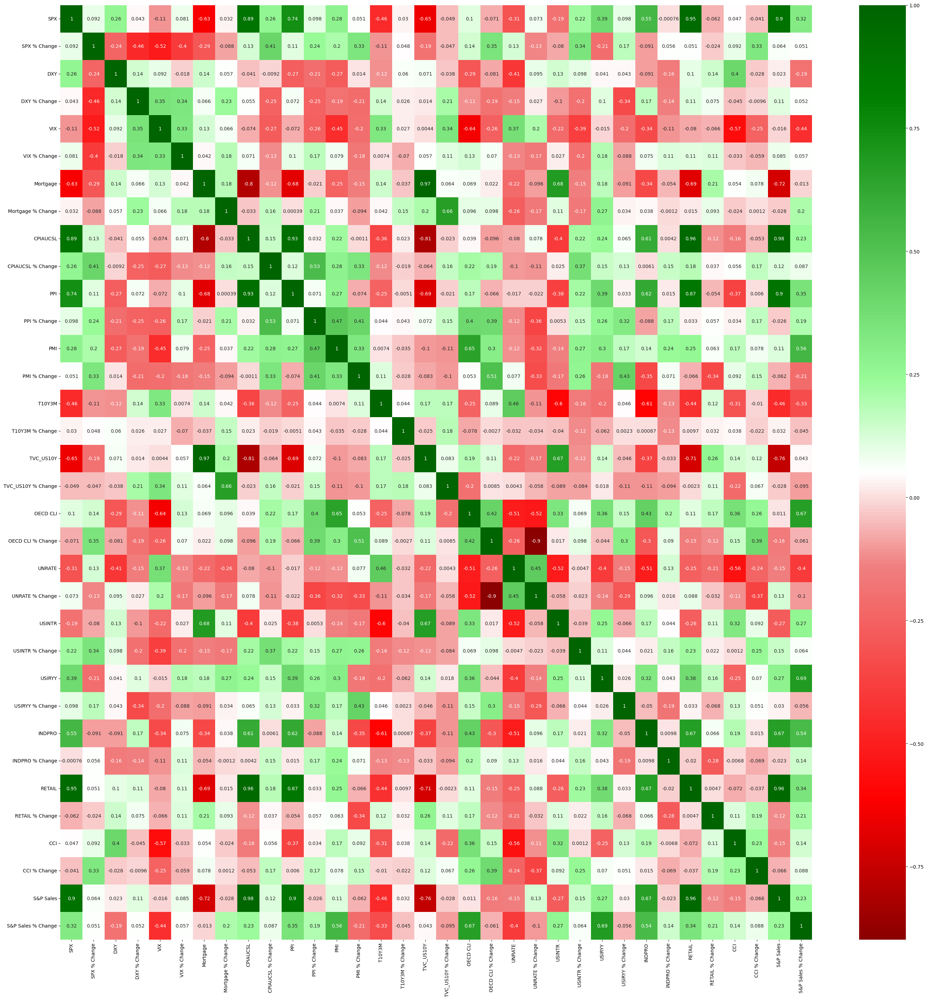

In [221]:
data_noNull = data
data_noNull.replace([np.inf, -np.inf], np.nan, inplace=True)
data_noNull.dropna(inplace = True)

# to make sure the correlation heatmap is still relatively similar to what it was before dropping null and infinity values.
createHeatmap(data_noNull,35)

# so, create a new dataframe for working with plotting
df_master_2000_nullDrop = df_master_2000
df_master_2000_nullDrop.replace([np.inf, -np.inf], np.nan, inplace=True)
df_master_2000_nullDrop.dropna(inplace = True)

Observation from logarithmic correlation heatmap:
1. S&P Quarterly Sales vs. Retail Sales = 0.96
2. Retail Sales vs. Industry Production = 0.72
3. S&P Quarterly Sales vs. CPI = 0.98
4. S&P Quarterly Sales vs. PPI = 0.91
5. SPX Index vs. S&P Quarterly Sales = 0.89
6. SPX Index vs. Retail Sales = 0.94
7. S&P Quarterly Sales % Change vs. OECD Composite Leading Indicator = 0.66
8. S&P Quarterly Sales vs. TVC_US10Y = -0.73
9. SPX Index vs. Interest Rate % Change = 0.71

> Dual Axis Plots

In [222]:
def createDualAxisPlot(df1, df2, var1, var2):
    
    fig, ax = plt.subplots(1,1)
    color1 = random.choice(['r','b','purple','y','teal','brown','orange','gray'])
    color2 = random.choice(['r','b','purple','y','teal','brown','orange','gray'])
    df_master_2000_nullDrop.plot(x='time',y=df1, color=color1, ax=ax)
    ax.set_ylabel(var1, color=color1)

    ax2 = ax.twinx()
    df_master_2000_nullDrop.plot(x='time',y=df2, color=color2, ax=ax2)
    ax2.set_ylabel(var2, color=color2)
    ax.set_xlabel('Time')

    # adding grid and title
    plt.grid(which="major", color='k', linestyle='-.', linewidth=0.1)
    plt.title(var1 + ' and ' + var2)
    # adding vertical lines
    for xc in xposition:
        ax.axvline(x=xc, color='k', linestyle='dashed')
    plt.show()

convert time series using pd.to_datetime for plotting data.

In [223]:
df_master_2000['time'] = pd.to_datetime(df_master_2000['time'], infer_datetime_format=True)


In [224]:
print(df_master_2000.columns)

Index(['time', 'SPX', 'SPX % Change', 'DXY', 'DXY % Change', 'VIX',
       'VIX % Change', 'Mortgage', 'Mortgage % Change', 'CPIAUCSL',
       'CPIAUCSL % Change', 'PPI', 'PPI % Change', 'PMI', 'PMI % Change',
       'T10Y3M', 'T10Y3M % Change', 'TVC_US10Y', 'TVC_US10Y % Change',
       'OECD CLI', 'OECD CLI % Change', 'UNRATE', 'UNRATE % Change', 'USINTR',
       'USINTR % Change', 'USIRYY', 'USIRYY % Change', 'INDPRO',
       'INDPRO % Change', 'RETAIL', 'RETAIL % Change', 'CCI', 'CCI % Change',
       'S&P Sales', 'S&P Sales % Change'],
      dtype='object')


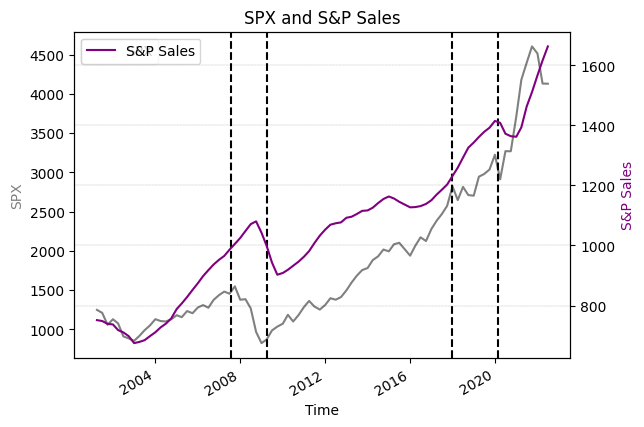

In [225]:
createDualAxisPlot('SPX','S&P Sales','SPX','S&P Sales')

S&P Quarterly Sales and SPX Index go together in the same direction

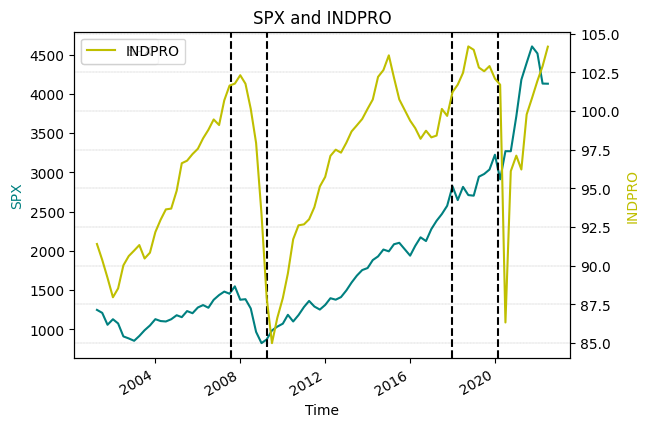

In [226]:
createDualAxisPlot('SPX','INDPRO','SPX','INDPRO')

**SPX (S&P500 Index) seems to correlate well with SPX, but the stock prices are leading**

In [1]:
createDualAxisPlot('S&P Sales', 'INDPRO', 'S&P Sales', 'INDPRO')

NameError: name 'createDualAxisPlot' is not defined

**A correlation is strong between S&P Sales and INDPRO. S&P Quarterly Sales seems to lead INDPRO by a quarter**

***

inspect later when finishing

In [2]:
createDualAxisPlot('OECD CLI', 'S&P Sales', 'OECD CLI', 'S&P Sales')

NameError: name 'createDualAxisPlot' is not defined

OECD Composite Leading Incidator seems to lead S&P Quarterly Sales 

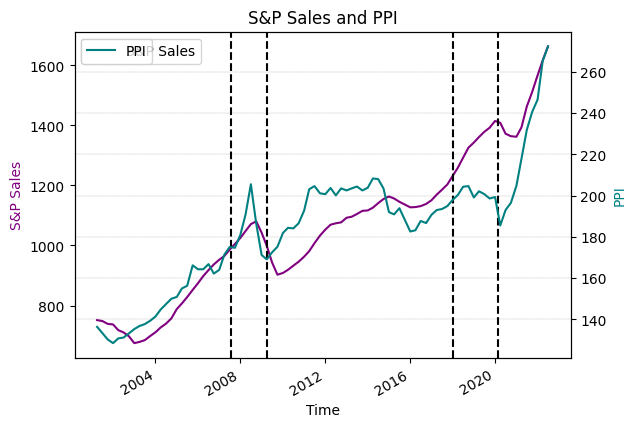

In [229]:
createDualAxisPlot('S&P Sales', 'PPI', 'S&P Quarterly Sales', 'PPI')

PPI seems to lead S&P Quarterly Sales

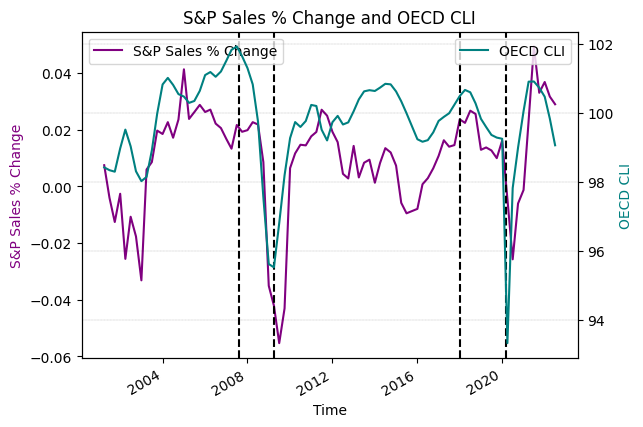

In [230]:
createDualAxisPlot('S&P Sales % Change', 'OECD CLI', 'S&P Sales % Change', 'OECD Composite Leading Indicator')

**OECD CLI seems to lead S&P Sales % Change**

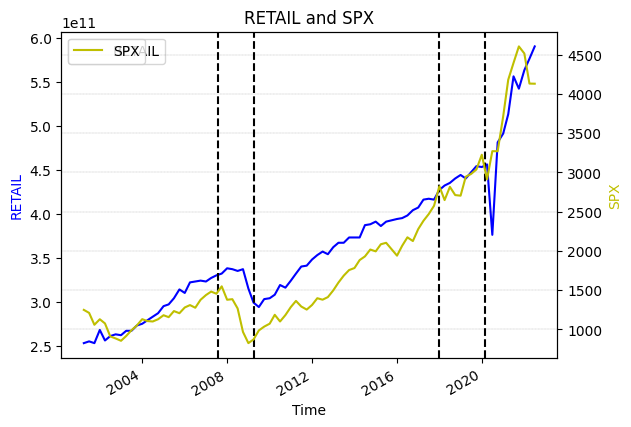

In [231]:
createDualAxisPlot('RETAIL', 'SPX', 'RETAIL', 'SPX')

Retail Sales seems to be a lagging indicator for S&P500 Index

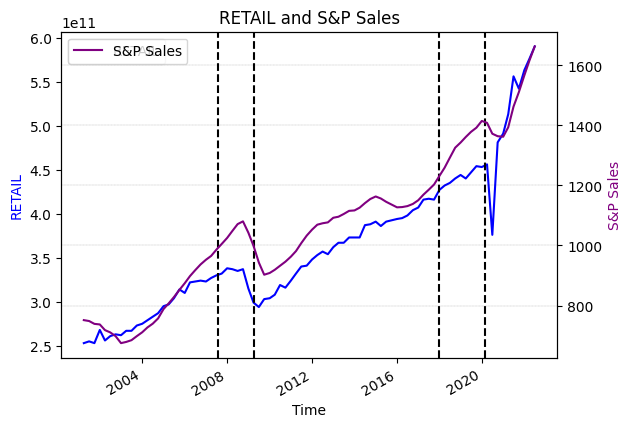

In [232]:
createDualAxisPlot('RETAIL', 'S&P Sales', 'RETAIL', 'S&P Quarterly Sales')

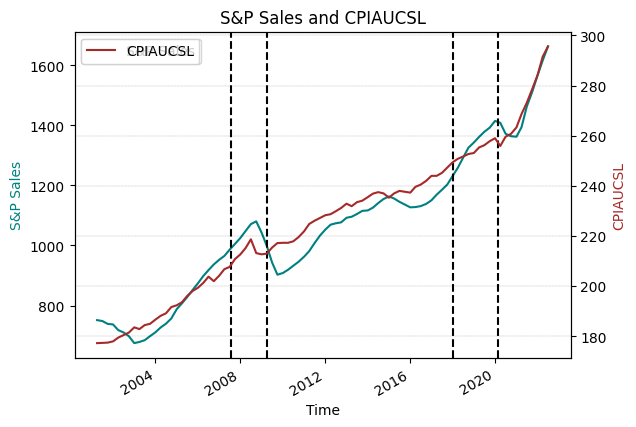

In [233]:
createDualAxisPlot('S&P Sales', 'CPIAUCSL', 'S&P Sales', 'CPIAUCSL')

SPX and CPI

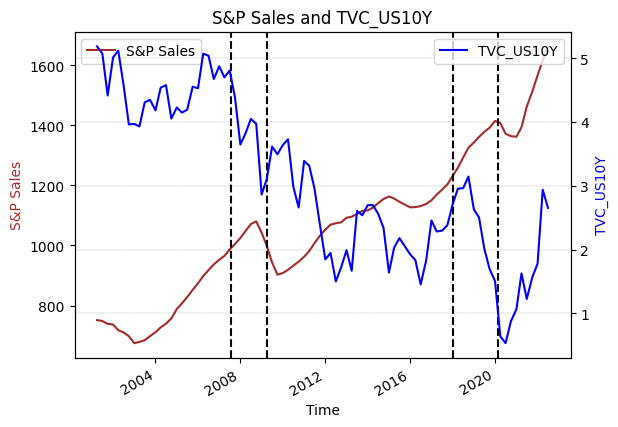

In [234]:
createDualAxisPlot('S&P Sales', 'TVC_US10Y', 'S&P Sales', 'TVC_US10Y')

S&P Quarterly Sales and 10 Year Treasury Bond:
- correlation exists, but cannot be used an indicative for forecasting stock market movements. 

<AxesSubplot:xlabel='S&P Sales', ylabel='RETAIL'>

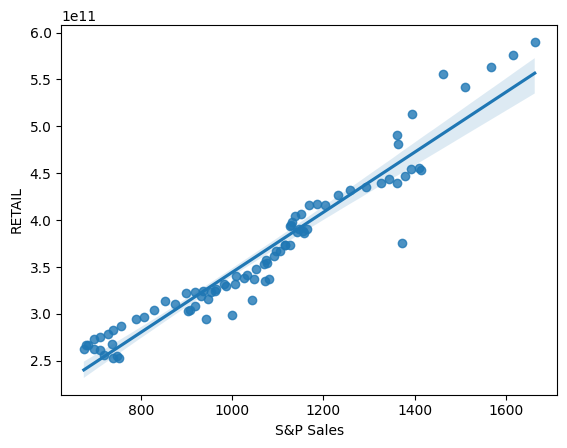

In [235]:
sns.regplot(x="S&P Sales", y="RETAIL", data=df_master_2000_nullDrop)

3. Statistical Analysis

> Pearson Correlation Scatter Matrix

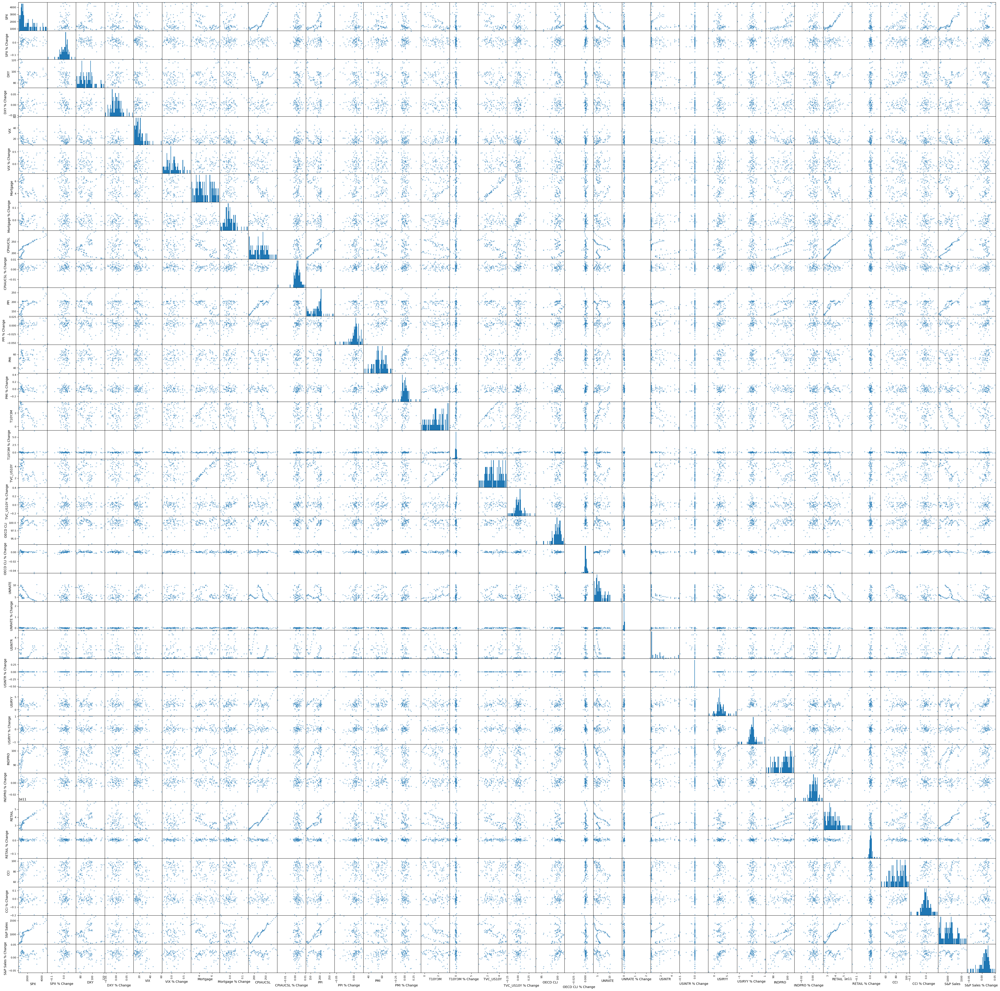

In [236]:
from pandas.plotting import scatter_matrix
scatter_matrix(data_noNull, figsize = (55,55), hist_kwds= {'bins':50})
plt.show()

- In multivariate statistics and probability theory, the scatter matrix is a statistic that is used to make estimates of the covariance matrix, for instance of the multivariate normal distribution.
- The above scatter matrix is the combination of histograms for each Dataframe and a subsequent scattered plot taking two Dataframes at a time. From the graph, we can clearly figure out that Unemployment Rate is loosely showing a linear correlation with 10yr Treasury Yield.

> Granger Causality Test
- Grenger Causality assumes all the data are stationary by either cointegration or differencing transformations. 
    - Info available on # https://www.statology.org/granger-causality-test-in-python/#:~:text=The%20Granger%20Causality%20test%20is,is%20useful%20for%20forecasting%20another.&text=The%20term%20%E2%80%9CGranger%2Dcauses%E2%80%9D,at%20a%20later%20time%20period.

In [237]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import grangercausalitytests

In [238]:
# Set up a new simillar dataframe for this purpose.

df_granger = df_master_2000_nullDrop[['time','S&P Sales', 'S&P Sales % Change', 'OECD CLI', 'OECD CLI % Change']].copy()
df_granger.dropna(inplace=True)
df_granger.reset_index(drop=True, inplace=True)
df_granger.tail()


,time,S&P Sales,S&P Sales % Change,OECD CLI,OECD CLI % Change
80,2021-07-01 08:30:00-05:00,1462.75,0.049431,100.902980,-0.000477
81,2021-10-01 08:30:00-05:00,1511.10,0.033054,100.721746,-0.000529
82,2022-01-03 08:30:00-06:00,1566.80,0.036861,100.462423,-0.001213
83,2022-04-01 08:30:00-05:00,1616.48,0.031708,99.828905,-0.002521
84,2022-07-01 08:30:00-05:00,1663.36,0.029001,99.055713,-0.002241


First we need to test each data series to make sure it is stationary using the Augmented Dickey Fuller test.

In [239]:
# Test for stationarity with Augmented Dickey-Fuller test, looking for ADF Stat less than critical
# values and p-value <= 0.05

X = df_granger.iloc[:,1].values
result = adfuller(X)
print('[S&P Quarterly Sales]')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

[S&P Quarterly Sales]
ADF Statistic: 0.856152
p-value: 0.992491
Critical Values:
	1%: -3.521
	5%: -2.901
	10%: -2.588


In [240]:
X = df_granger.iloc[:,2].values  # SPX % Change
result = adfuller(X)
print('[S&P Quarterly Sales % Change]')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))


[S&P Quarterly Sales % Change]
ADF Statistic: -2.677898
p-value: 0.077942
Critical Values:
	1%: -3.519
	5%: -2.900
	10%: -2.587


In [241]:
X = df_granger.iloc[:,3].values  
result = adfuller(X)
print('[OECD CLI]')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))


[OECD CLI]
ADF Statistic: -3.520373
p-value: 0.007479
Critical Values:
	1%: -3.511
	5%: -2.897
	10%: -2.585


In [242]:
X = df_granger.iloc[:,4].values  
result = adfuller(X)
print('[OECD CLI % Change]')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))


[OECD CLI % Change]
ADF Statistic: -10.581507
p-value: 0.000000
Critical Values:
	1%: -3.511
	5%: -2.897
	10%: -2.585


• OECD CLI proves to be stationary, but S&P Quarterly Sales is not. It will need to be differenced.

In [243]:
df_granger['S&P Sales Diff'] = df_granger['S&P Sales'].diff()
df_granger['S&P Sales % Change Diff'] = df_granger['S&P Sales % Change'].diff()
df_granger.dropna(inplace=True)
df_granger.head()


,time,S&P Sales,S&P Sales % Change,OECD CLI,OECD CLI % Change,S&P Sales Diff,S&P Sales % Change Diff
1,2001-07-02 08:30:00-05:00,748.23,-0.004046,98.334812,-0.000395,-3.04,-0.011516
2,2001-10-01 08:30:00-05:00,738.81,-0.012590,98.291049,0.000483,-9.42,-0.008543
3,2002-01-02 08:30:00-06:00,736.88,-0.002612,98.964744,0.002823,-1.93,0.009977
4,2002-04-01 08:30:00-06:00,718.01,-0.025608,99.509253,0.000830,-18.87,-0.022996
5,2002-07-01 08:30:00-05:00,710.31,-0.010724,99.026682,-0.002568,-7.70,0.014884


In [244]:
X = df_granger.iloc[:,5].values 
result = adfuller(X)
print('SPX Diff')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

X = df_granger.iloc[:,6].values 
result = adfuller(X)
print('SPX % Change Diff')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

SPX Diff
ADF Statistic: -2.286575
p-value: 0.176335
Critical Values:
	1%: -3.521
	5%: -2.901
	10%: -2.588
SPX % Change Diff
ADF Statistic: -4.924933
p-value: 0.000031
Critical Values:
	1%: -3.519
	5%: -2.900
	10%: -2.587


The differenced data series are stationary.

Now, plot of the S&P Sales Pct Change series after differencing, to show what stationarity looks like.

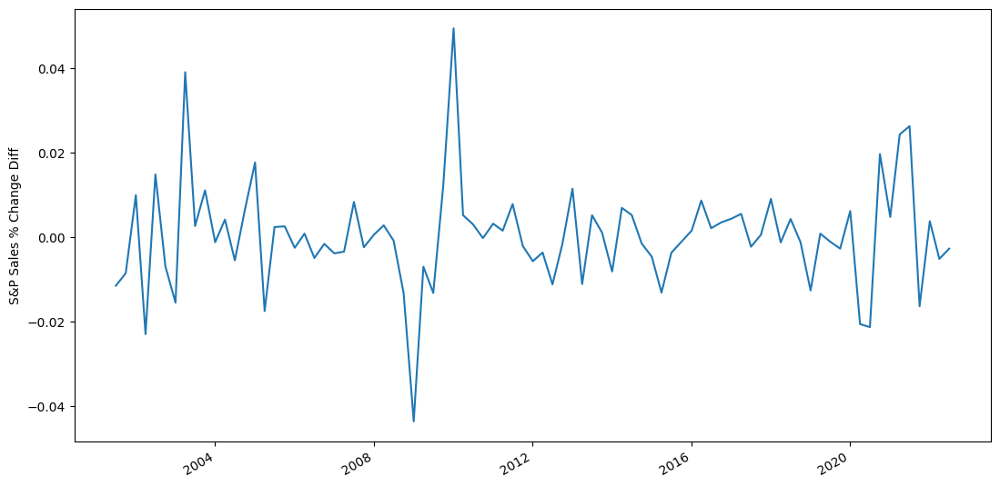

In [245]:
import matplotlib.dates as mdates

x = df_granger['time']
y = df_granger['S&P Sales % Change Diff']

fig = plt.figure(figsize = (13,7))
ax = fig.add_subplot(111)
ax.set_ylabel('S&P Sales % Change Diff')
ax.plot(x, y)

# format your data to desired format. 
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# rotate and align the tick labels so they look better
fig.autofmt_xdate()

plt.show()

> Granger Causality Test
- between the OECD CLI as the independent variable and the S&P PRICE % Change series as the dependent variable. <br>

This test uses the following null and alternative hypotheses:

Null Hypothesis (H0): Time series x does not Granger-cause time series y

Alternative Hypothesis (HA): Time series x Granger-causes time series y <br>

*"The F test statistic turns out to be 5.405 and the corresponding p-value is 0.0030. Since the p-value is less than .05, we can reject the null hypothesis of the test and conclude that knowing the number of eggs is useful for predicting the future number of chickens."*

In [246]:
gc_results = grangercausalitytests(df_granger[['S&P Sales % Change Diff', 'OECD CLI']], maxlag=5, verbose=True)

print(gc_results)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5290  , p=0.4691  , df_denom=80, df_num=1
ssr based chi2 test:   chi2=0.5489  , p=0.4588  , df=1
likelihood ratio test: chi2=0.5470  , p=0.4595  , df=1
parameter F test:         F=0.5290  , p=0.4691  , df_denom=80, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.7023 , p=0.0000  , df_denom=77, df_num=2
ssr based chi2 test:   chi2=27.0542 , p=0.0000  , df=2
likelihood ratio test: chi2=23.3803 , p=0.0000  , df=2
parameter F test:         F=12.7023 , p=0.0000  , df_denom=77, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=10.7642 , p=0.0000  , df_denom=74, df_num=3
ssr based chi2 test:   chi2=35.3474 , p=0.0000  , df=3
likelihood ratio test: chi2=29.3326 , p=0.0000  , df=3
parameter F test:         F=10.7642 , p=0.0000  , df_denom=74, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=9.1969  , p=0.0000  , df_d

Now that we're pretty sure the CLI leads S&P Sales Changes, let's see if we can do further regression analysis to make some predictions.
First we will try to predict CLI values a few months out with the ARIMA autoregression model from the Statsmodels library, then use LinearRegression from Scikit Learn to predict S&P Sales changes from the predicted CLI values.

In [306]:
# Isolate S&P Sales % Change numbers into separate dataframe
date = df_master_2000_nullDrop[['time', 'OECD CLI']].copy()
date['time'] = pd.to_datetime(date['time'], utc=True,infer_datetime_format=True) # datetime.striptime(df_all['time'], '%Y-%m-%d')
X = date
X.set_index(['time'], inplace=True)
X.astype(float)
X = X.dropna()

X = X.loc['2001-01-01':]

X = X.iloc[:, 0]

X


time
2001-04-02 13:30:00+00:00     98.415757
2001-07-02 13:30:00+00:00     98.334812
2001-10-01 13:30:00+00:00     98.291049
2002-01-02 14:30:00+00:00     98.964744
2002-04-01 14:30:00+00:00     99.509253
                                ...    
2021-07-01 13:30:00+00:00    100.902980
2021-10-01 13:30:00+00:00    100.721746
2022-01-03 14:30:00+00:00    100.462423
2022-04-01 13:30:00+00:00     99.828905
2022-07-01 13:30:00+00:00     99.055713
Name: OECD CLI, Length: 85, dtype: float64

The autocorrelation plot below indicates we can play with lagging the CLI up to 10 periods to get a decent fit.

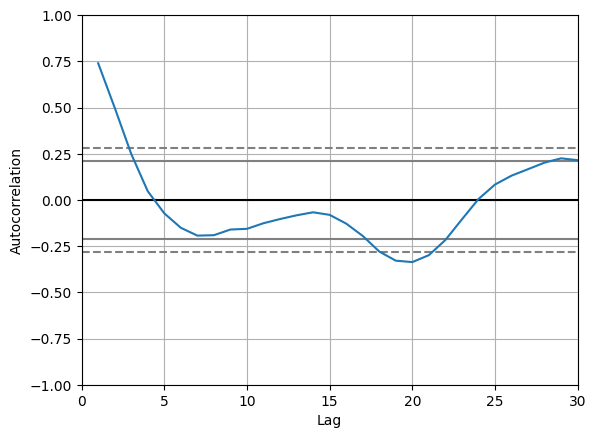

In [307]:
from pandas.plotting import autocorrelation_plot

ax = autocorrelation_plot(X)
ax.set_xlim([0, 30])

plt.show()

The ARIMA residuals plots below indicate that we can optimize the fit with 1 lag period and 1 differencing operation. The idea is to get the residuals mean as close to zero as possible without overdoing it.

                               SARIMAX Results                                
Dep. Variable:               OECD CLI   No. Observations:                  256
Model:                 ARIMA(1, 1, 0)   Log Likelihood                     nan
Date:                Sat, 14 Jan 2023   AIC                                nan
Time:                        00:24:28   BIC                                nan
Sample:                    04-30-2001   HQIC                               nan
                         - 07-31-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1               0        nan        nan        nan         nan         nan
sigma2            nan        nan        nan        nan         nan         nan
Ljung-Box (L1) (Q):                    nan   Jarque-

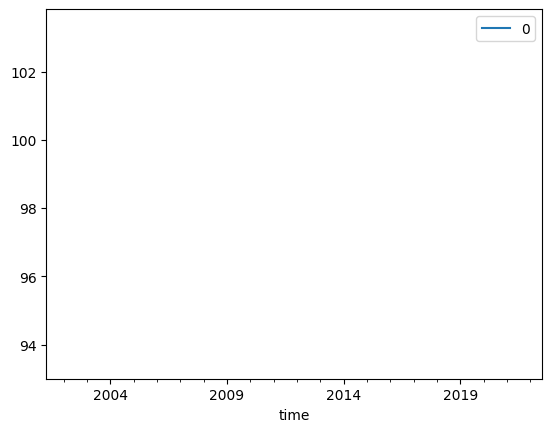

ValueError: `dataset` input should have multiple elements.

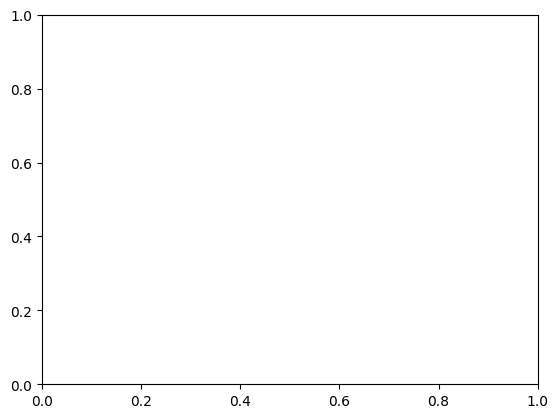

In [309]:
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
# import statsmodels.api as sm

X = X.resample("M").last()
# model = sm.tsa.ARIMA(X, order=(1,1,0), freq='M')
model = ARIMA(X, order=(1,1,0), freq='M')
# model_fit = model.fit(disp=0)
model_fit = model.fit()
print(model_fit.summary())
# plot residual errors
residuals = DataFrame(model_fit.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())


Now we go ahead and fit the data into the model and forecast for three months out.

In [194]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

Xv = X.values

size = int(len(Xv) * .66)
train, test = Xv[0:size], Xv[size:len(Xv)]
history = [x for x in train]
predictions = list()

for t in range(len(test)):
    model = ARIMA(history, order=(1,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))

error = mean_squared_error(test, predictions)
print('Test MSE: %.3f' % error)

plt.figure(figsize=(10,5))
plt.ylabel('OECD CLI')
plt.xlabel('Test Periods')
plt.title('OECD CLI Predictions (predicted line = Red)')

plt.plot(test)
plt.plot(predictions, color='red')

plt.show()


predicted=nan, expected=100.329222
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=99.982786
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=99.230518
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=99.158422
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=99.204392
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=99.430297
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=99.760745
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=99.877251
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=99.982938
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan, expected=100.230231
predicted=nan, expected=nan
predicted=nan, expected=nan
predicted=nan,

ValueError: Input contains NaN.

The forecasted CLI numbers below seem to indicate that it may slowly rise but will stay below 100 for at least the next three months. Below 100 indicates economic activity below the long term trend.

In [304]:
print("Periods in training set: ", len(X))
forecast = model_fit.forecast(steps=4)
forecast

Periods in training set:  84


array([nan, nan, nan, nan])

In [277]:
print()
print("Oct 2022:")
print("Forecast Value: ", (forecast[0]))
print()
print("Nov 2022:")
print("Forecast Value: ", (forecast[1]))
print()
print("Dec 2022:")
print("Forecast Value: ", (forecast[2]))
print()
print("Jan 2023:")
print("Forecast Value: ", (forecast[3]))


Oct 2022:
Forecast Value:  -0.03352596534741613

Nov 2022:
Forecast Value:  -0.06769752394859367

Dec 2022:
Forecast Value:  -0.052192170502556576

Jan 2023:
Forecast Value:  -0.059227728590277216


Now that we have a predicted range for the CLI over the next few months, basically 9.2 to 9.9, what can we predict for S&P Sales changes based on those values?

*** 
## 4. Machine Learning - Linear Regression
- if I'm going to do modeling, what model am I trying to build? 
    - linear regression model after generating mathmatical algorithm
- What am i trying to get out of this?
    - predict stock price based on cpi movement. 
- fit the data into the model and forecast for three months out.

Predicting stock prices is an enigmatic task pursued by many. Spot-on accuracy may not be practical but sometimes even simple linear models can be surprisingly close.

In [301]:
# Split data into testing and training sets: 8:2 split
X = df_granger['OECD CLI'].values.reshape(-1,1)
y = df_granger['S&P Sales % Change'].values.reshape(-1,1)
X_train, X_tst, y_train, y_tst = train_test_split(X, y, test_size=0.2,random_state=0)

model = LinearRegression()
model.fit(X_train, y_train)

# retrieve intercept and slope:
print(model.intercept_)
print(model.coef_)


[-0.87738726]
[[0.00890028]]


In [302]:
model_prediction = model.predict(X_tst)

df_results = pd.DataFrame({'Actual': y_tst.flatten(), 'Predicted': model_prediction.flatten()})
df_results

,Actual,Predicted
0,-0.035126,-0.026365
1,0.027069,0.008253
2,0.015615,0.011809
3,0.001282,0.018229
4,0.016737,0.026025
5,0.007326,0.018106
6,-0.002612,0.003426
7,-0.009511,0.012487
8,0.019858,0.024116
9,0.008576,0.002903


In [303]:
# Printout relevant metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
print("Model Coefficients:", model.coef_)
print("Mean Absolute Error:", mean_absolute_error(y_tst, model_prediction))
print("Coefficient of Determination:", r2_score(y_tst, model_prediction))

print('Conclusively, Out of {} Price Moves, {:.2f}% Accuracy to predict the price accurately'.format(y_tst.shape[0], r2_score(y_tst, model_prediction)*100 ))

Model Coefficients: [[0.00890028]]
Mean Absolute Error: 0.00970225924715269
Coefficient of Determination: 0.5687882569057696
Conclusively, Out of 17 Price Moves, 56.88% Accuracy to predict the price accurately


In [275]:
stdev = np.sqrt(sum((model.predict(X_train) - y_train)**2) / (len(y_train) - 2))
conf_intvl = stdev * 1.96

print('Mean Absolute Error:', metrics.mean_absolute_error(y_tst, model_prediction))  
print('Mean Squared Error:', metrics.mean_squared_error(y_tst, model_prediction))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_tst, model_prediction)))
print('Regression Score:', model.score(X_tst, y_tst))
print('Standard Deviation:', stdev)
print('95% Confidence Interval: -/+', conf_intvl)

Mean Absolute Error: 0.00970225924715269
Mean Squared Error: 0.00013217496232649148
Root Mean Squared Error: 0.011496737029544143
Regression Score: 0.5687882569057696
Standard Deviation: [0.01483836]
95% Confidence Interval: -/+ [0.02908318]


The scatter plot of predicted S&P values below compares well with actual values shown in the scatter plot up above.

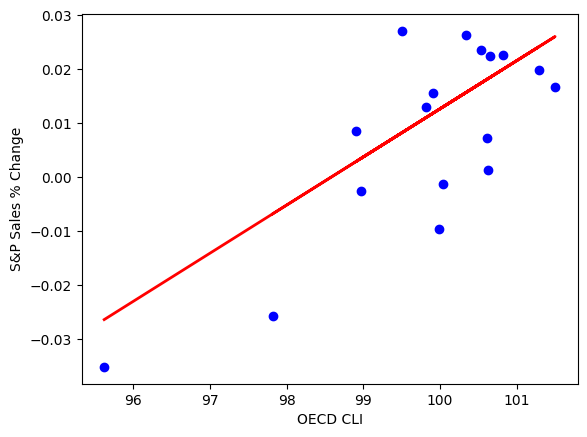

In [277]:
plt.scatter(X_tst, y_tst,  color='blue')
plt.plot(X_tst, model_prediction, color='red', linewidth=2)
plt.xlabel("OECD CLI")
plt.ylabel("S&P Sales % Change")
plt.show()


**The prediction model proves to have around 57% accuracy in average. It is evidently proven that there is a clear linear relationship between OECD Composite Leading Indicator and S&P Qurterly Sales movement**